<a href="https://colab.research.google.com/github/MilKotik-Cyber/CV_LB_1/blob/main/CV_LB_1_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install opencv-python opencv-python-headless
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
from google.colab.patches import cv2_imshow
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
#Импорт изображений

image_1 = '/content/drive/MyDrive/Colab_Notebooks/CV_LB/CV_LB_1/Image/Image_1.jpg'
img = cv2.imread(image_1)
img = cv2.resize(img, (600, 300))
cv2.imwrite('/content/drive/MyDrive/Colab_Notebooks/CV_LB/CV_LB_1/Image/Image_1.jpg', img)
image_path_main = '/content/drive/MyDrive/Colab_Notebooks/CV_LB/CV_LB_1/Image/Image_1.jpg'

Размер исходного изображения: 300x600
Промежуточные изображения каналов до эрозии:
Размер синего канала: 300x600


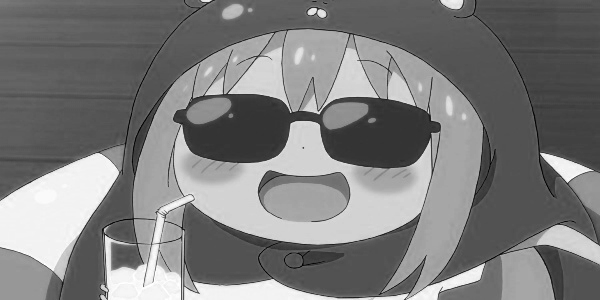

Размер зеленого канала: 300x600


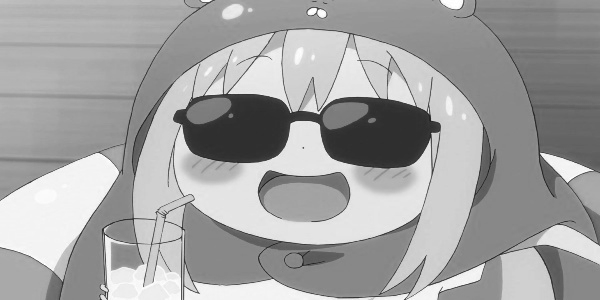

Размер красного канала: 300x600


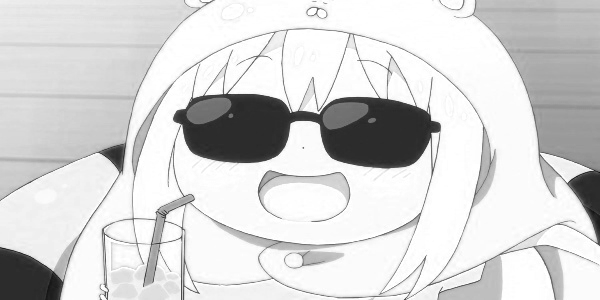

Канал - Синий канал
Размер изображения до эрозии: 300x600
Размер изображения после добавления padding: 304x604
Размер изображения после эрозии: 300x600


Канал - Зелёный канал
Размер изображения до эрозии: 300x600
Размер изображения после добавления padding: 304x604
Размер изображения после эрозии: 300x600


Канал - Красный канал
Размер изображения до эрозии: 300x600
Размер изображения после добавления padding: 304x604
Размер изображения после эрозии: 300x600


Промежуточные изображения каналов после эрозии:
Размер синего канала после эрозии: 300x600


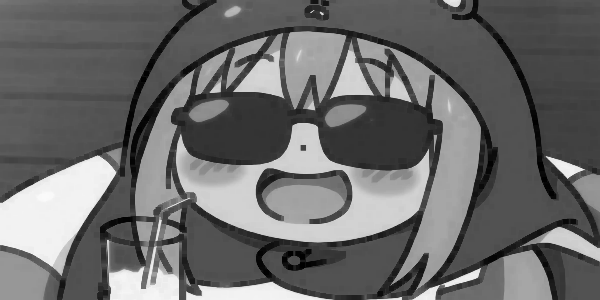

Размер зеленого канала после эрозии: 300x600


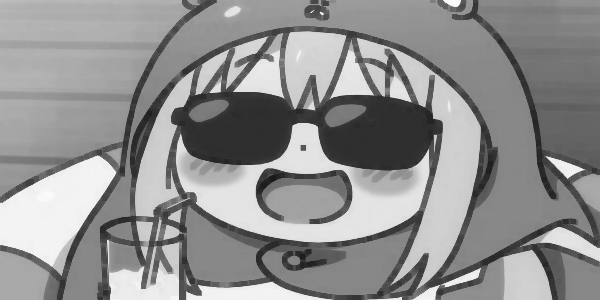

Размер красного канала после эрозии: 300x600


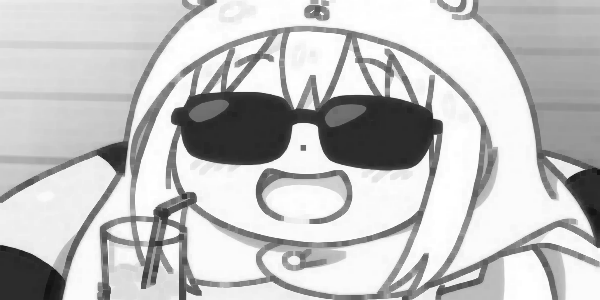



Размер итогового изображения после эрозии: 300x600


Исходное изображение:


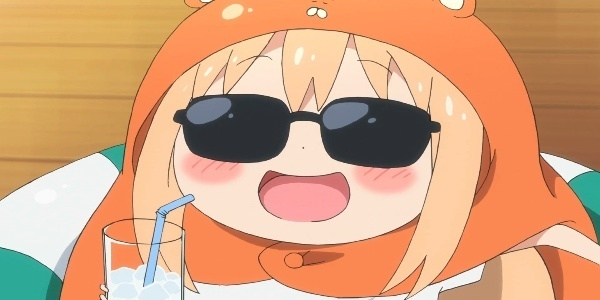




Изображение после эрозии:


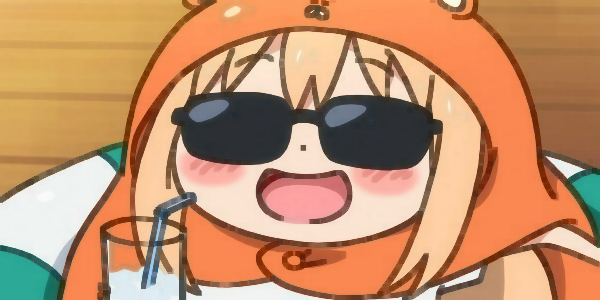

In [4]:
#@title Фильтр эрозии (итоговый)
def erosion_manual(img, kernel_size, chanel):
    print("Канал - " + str(chanel))
    rows, cols = img.shape
    print(f"Размер изображения до эрозии: {rows}x{cols}")

    padding = kernel_size // 2

    # Создание расширенного изображения с replicate padding
    padded_img = np.zeros((rows + 2 * padding, cols + 2 * padding), dtype=img.dtype)
    padded_img[padding:rows + padding, padding:cols + padding] = img

    # Заполнение границ
    padded_img[:padding, padding:cols + padding] = img[0, :]  # Верхняя граница
    padded_img[rows + padding:, padding:cols + padding] = img[rows - 1, :]  # Нижняя граница
    padded_img[:, :padding] = np.tile(padded_img[:, padding:padding+1], padding)  # Левая граница
    padded_img[:, cols + padding:] = np.tile(padded_img[:, cols + padding - 1:cols + padding], padding)  # Правая граница

    print(f"Размер изображения после добавления padding: {padded_img.shape[0]}x{padded_img.shape[1]}")

    eroded_img = np.zeros_like(img, dtype=img.dtype) #Копия оригинального размера изображения

    # Применение фильтра к расширенному
    for i in range(padding, rows + padding):
        for j in range(padding, cols + padding):
            window = padded_img[i - padding:i + padding + 1, j - padding:j + padding + 1]
            eroded_img[i-padding, j-padding] = np.min(window)

    print(f"Размер изображения после эрозии: {eroded_img.shape[0]}x{eroded_img.shape[1]}")
    print("")
    print("")
    return eroded_img


def erosion_color(img, kernel_size):

    b, g, r = cv2.split(img)  # Разделение на каналы

    # Вывод промежуточного изображения каналов до эрозии
    print("Промежуточные изображения каналов до эрозии:")
    print(f"Размер синего канала: {b.shape[0]}x{b.shape[1]}")
    cv2_imshow(b)
    print(f"Размер зеленого канала: {g.shape[0]}x{g.shape[1]}")
    cv2_imshow(g)
    print(f"Размер красного канала: {r.shape[0]}x{r.shape[1]}")
    cv2_imshow(r)

    b_eroded = erosion_manual(b, kernel_size, "Синий канал")  # Эрозия синего канала
    g_eroded = erosion_manual(g, kernel_size, "Зелёный канал") # Эрозия зеленого канала
    r_eroded = erosion_manual(r, kernel_size,  "Красный канал") # Эрозия красного канала

    # Вывод промежуточного изображения каналов после эрозии
    print("Промежуточные изображения каналов после эрозии:")
    print(f"Размер синего канала после эрозии: {b_eroded.shape[0]}x{b_eroded.shape[1]}")
    cv2_imshow(b_eroded)
    print(f"Размер зеленого канала после эрозии: {g_eroded.shape[0]}x{g_eroded.shape[1]}")
    cv2_imshow(g_eroded)
    print(f"Размер красного канала после эрозии: {r_eroded.shape[0]}x{r_eroded.shape[1]}")
    cv2_imshow(r_eroded)

    eroded_img = cv2.merge((b_eroded, g_eroded, r_eroded))  # Объединение каналов
    print("")
    print("")
    print(f"Размер итогового изображения после эрозии: {eroded_img.shape[0]}x{eroded_img.shape[1]}")

    return eroded_img

if __name__ == '__main__':
    image_path = image_path_main  # Изображение
    kernel_size = 5  # Размер ядра

    try:
        img = cv2.imread(image_path)
        if img is None:
            raise FileNotFoundError(f"Изображение не найдено по пути: {image_path}.")
    except FileNotFoundError as e:
        print(e)
        exit()
    except Exception as e:
        print(f"Ошибка при загрузке изображения: {e}")
        exit()

    print(f"Размер исходного изображения: {img.shape[0]}x{img.shape[1]}")
    eroded_img = erosion_color(img, kernel_size)

    if eroded_img is not None:
        print("")
        print("")
        print("Исходное изображение:")
        cv2_imshow(img)
        print("")
        print("")
        print("\nИзображение после эрозии:")
        cv2_imshow(eroded_img)
    else:
        print("Обработка изображения не удалась.")

Размер исходного изображения: 300x600
Промежуточные изображения каналов до эрозии:
Размер синего канала: 300x600


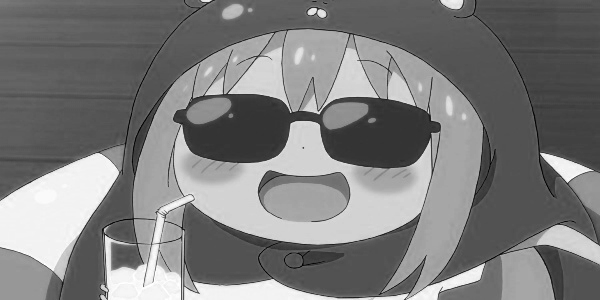

Размер зеленого канала: 300x600


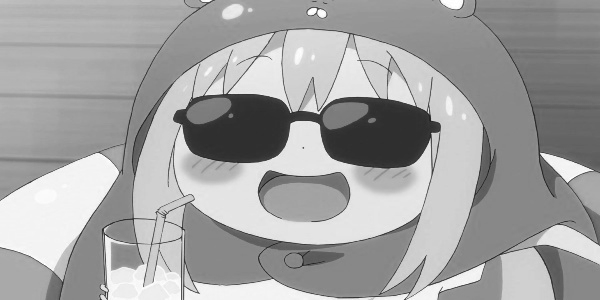

Размер красного канала: 300x600


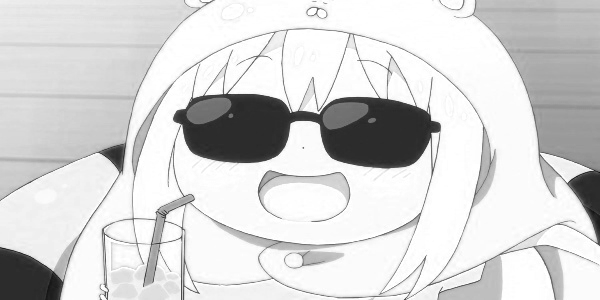

Канал - Синий канал
Размер изображения до эрозии: 300x600
Размер изображения после добавления padding: 304x604
Размер изображения после эрозии: 300x600


Канал - Зелёный канал
Размер изображения до эрозии: 300x600
Размер изображения после добавления padding: 304x604
Размер изображения после эрозии: 300x600


Канал - Красный канал
Размер изображения до эрозии: 300x600
Размер изображения после добавления padding: 304x604
Размер изображения после эрозии: 300x600


Промежуточные изображения каналов после эрозии:
Размер синего канала после эрозии: 300x600


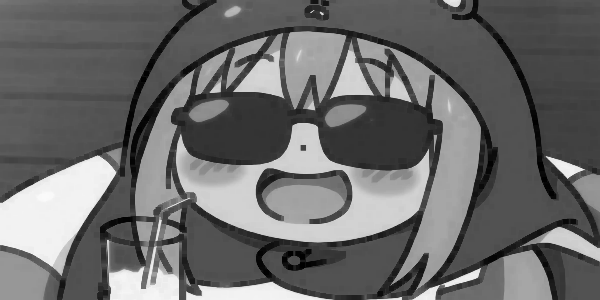

Размер зеленого канала после эрозии: 300x600


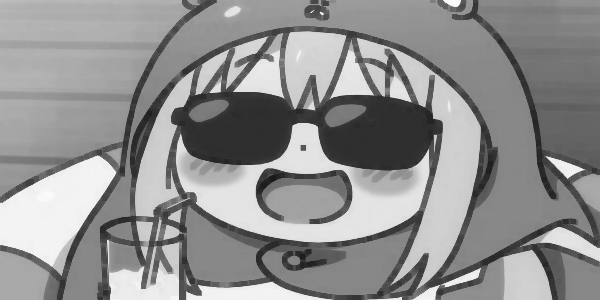

Размер красного канала после эрозии: 300x600


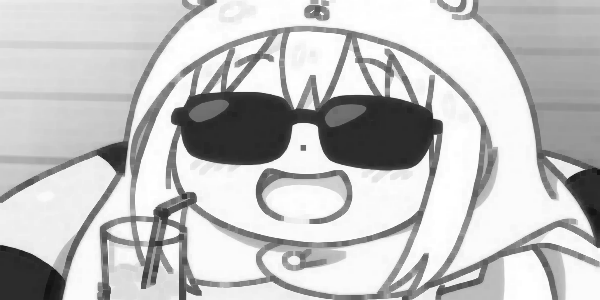



Размер итогового изображения после эрозии: 300x600


Исходное изображение:


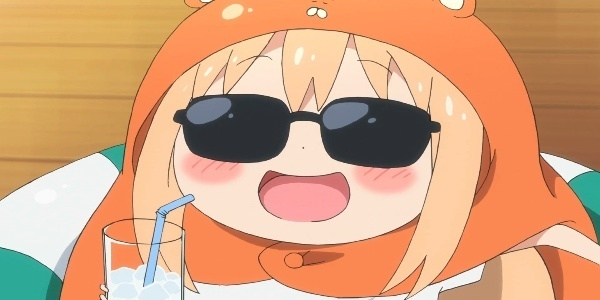




Изображение после эрозии:


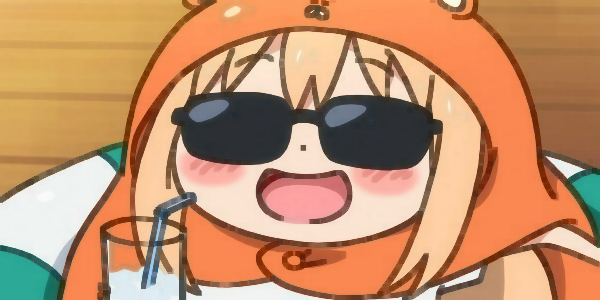

In [5]:
#@title Фильтр Дилатация(итоговый)
def dilation_manual(img, kernel_size, chanel):
    print("Канал - " + str(chanel))

    rows, cols = img.shape
    print(f"Размер изображения до дилатации: {rows}x{cols}")

    padding = kernel_size // 2

    # Создание расширенного изображения
    padded_img = np.zeros((rows + 2 * padding, cols + 2 * padding), dtype=img.dtype)
    padded_img[padding:rows + padding, padding:cols + padding] = img

    # Заполняем границы
    padded_img[:padding, padding:cols + padding] = img[0, :]  # Верхняя граница
    padded_img[rows + padding:, padding:cols + padding] = img[rows - 1, :]  # Нижняя граница
    padded_img[:, :padding] = np.tile(padded_img[:, padding:padding+1], padding)  # Левая граница
    padded_img[:, cols + padding:] = np.tile(padded_img[:, cols + padding - 1:cols + padding], padding)  # Правая граница

    # Вывод информации о размере увеличенного изображения
    print(f"Размер изображения после добавления padding: {padded_img.shape[0]}x{padded_img.shape[1]}")

    dilated_img = np.zeros_like(img, dtype=img.dtype)

    # Применяем дилатацию ко всему расширенному изображению
    for i in range(padding, rows + padding):
        for j in range(padding, cols + padding):
            window = padded_img[i - padding:i + padding + 1, j - padding:j + padding + 1]
            dilated_img[i-padding, j-padding] = np.max(window)

    print(f"Размер изображения после дилатации: {dilated_img.shape[0]}x{dilated_img.shape[1]}")
    print("")
    print("")
    return dilated_img


def dilation_color(img, kernel_size):

    b, g, r = cv2.split(img)  # Разделение на каналы

    # Вывод промежуточного изображения каналов до дилатации
    print("Промежуточные изображения каналов до дилатации:")
    print(f"Размер синего канала: {b.shape[0]}x{b.shape[1]}")
    cv2_imshow(b)
    print(f"Размер зеленого канала: {g.shape[0]}x{g.shape[1]}")
    cv2_imshow(g)
    print(f"Размер красного канала: {r.shape[0]}x{r.shape[1]}")
    cv2_imshow(r)

    b_dilated = dilation_manual(b, kernel_size, "Синий канал")  # Дилатация синего канала
    g_dilated = dilation_manual(g, kernel_size, "Зелёный канал")  # Дилатация зеленого канала
    r_dilated = dilation_manual(r, kernel_size, "Красный канал")  # Дилатация красного канала

    # Вывод промежуточного изображения каналов после дилатации
    print("Промежуточные изображения каналов после дилатации:")
    print(f"Размер синего канала после дилатации: {b_dilated.shape[0]}x{b_dilated.shape[1]}")
    cv2_imshow(b_dilated)
    print(f"Размер зеленого канала после дилатации: {g_dilated.shape[0]}x{g_dilated.shape[1]}")
    cv2_imshow(g_dilated)
    print(f"Размер красного канала после дилатации: {r_dilated.shape[0]}x{r_dilated.shape[1]}")
    cv2_imshow(r_dilated)

    dilated_img = cv2.merge((b_dilated, g_dilated, r_dilated))  # Объединение каналов
    print("")
    print("")
    print(f"Размер итогового изображения после дилатации: {dilated_img.shape[0]}x{dilated_img.shape[1]}")

    return dilated_img


if __name__ == '__main__':
    image_path = image_path_main  # Изображение
    kernel_size = 5  # Размер ядра

    try:
        img = cv2.imread(image_path)
        if img is None:
            raise FileNotFoundError(f"Изображение не найдено по пути: {image_path}.")
    except FileNotFoundError as e:
        print(e)
        exit()
    except Exception as e:
        print(f"Ошибка при загрузке изображения: {e}")
        exit()

    print(f"Размер исходного изображения: {img.shape[0]}x{img.shape[1]}")
    eroded_img = erosion_color(img, kernel_size)

    if eroded_img is not None:
        print("")
        print("")
        print("Исходное изображение:")
        cv2_imshow(img)
        print("")
        print("")
        print("\nИзображение после эрозии:")
        cv2_imshow(eroded_img)
    else:
        print("Обработка изображения не удалась.")

Размер исходного изображения: 300x600
Промежуточные изображения каналов до эрозии:
Размер синего канала: 300x600


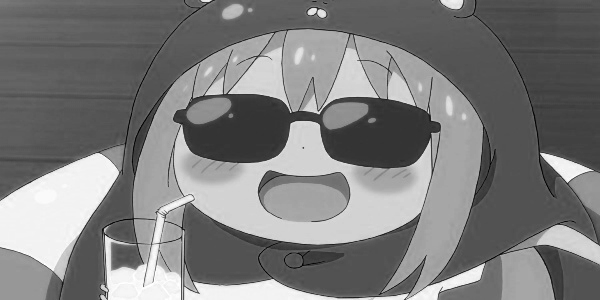

Размер зеленого канала: 300x600


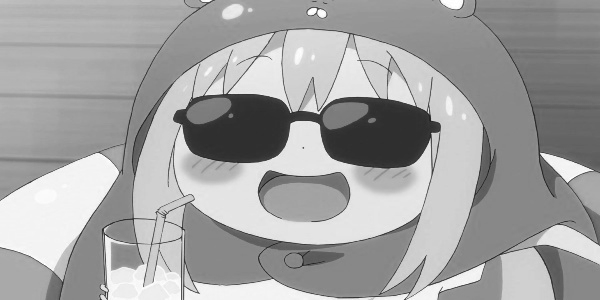

Размер красного канала: 300x600


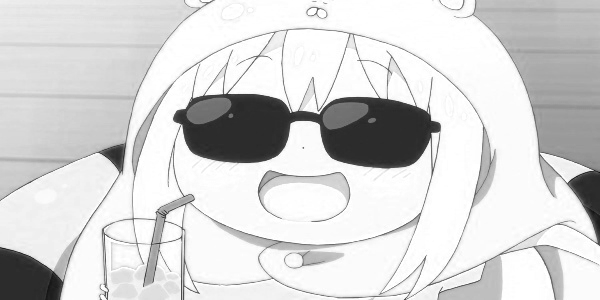

Канал - Синий канал
Размер изображения до эрозии: 300x600
Размер изображения после добавления padding: 304x604
Размер изображения после эрозии: 300x600


Канал - Зелёный канал
Размер изображения до эрозии: 300x600
Размер изображения после добавления padding: 304x604
Размер изображения после эрозии: 300x600


Канал - Красный канал
Размер изображения до эрозии: 300x600
Размер изображения после добавления padding: 304x604
Размер изображения после эрозии: 300x600


Промежуточные изображения каналов после эрозии:
Размер синего канала после эрозии: 300x600


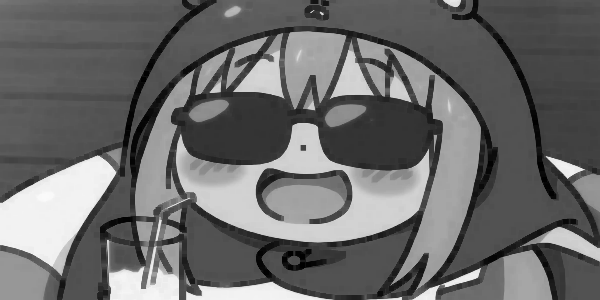

Размер зеленого канала после эрозии: 300x600


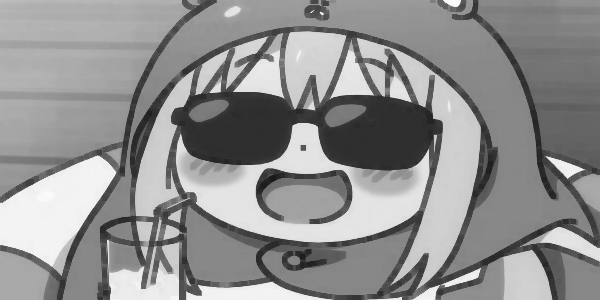

Размер красного канала после эрозии: 300x600


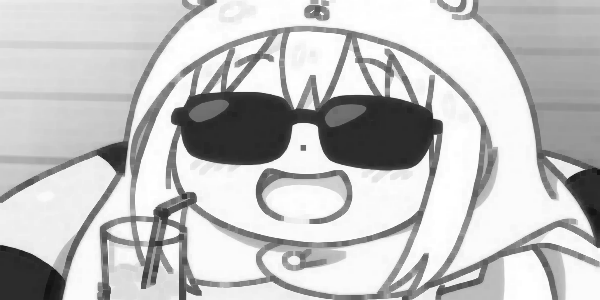



Размер итогового изображения после эрозии: 300x600


Исходное изображение:


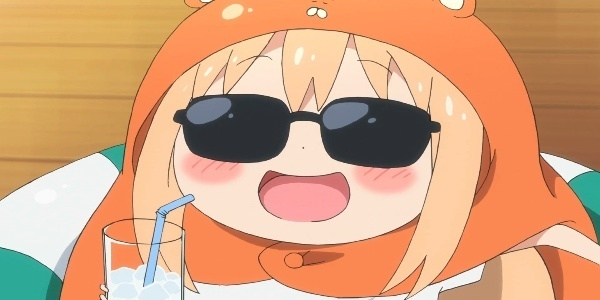




Изображение после эрозии:


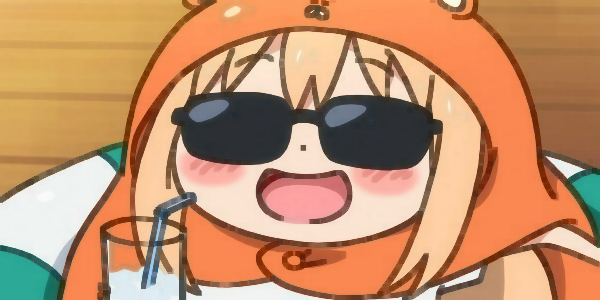

In [6]:
#@title Медианный фильтр (итоговый)
def median_filter_manual(img, kernel_size, chanel):
    print("Канал - " + str(chanel))

    rows, cols = img.shape
    print(f"Размер изображения до медианного фильтра: {rows}x{cols}")

    if kernel_size % 2 == 0:
        print("Ошибка: Размер ядра должен быть нечетным.")
        return None

    padding = kernel_size // 2


    padded_img = np.zeros((rows + 2 * padding, cols + 2 * padding), dtype=img.dtype)
    padded_img[padding:rows + padding, padding:cols + padding] = img

    # Заполняем границы
    padded_img[:padding, padding:cols + padding] = img[0, :]  # Верхняя граница
    padded_img[rows + padding:, padding:cols + padding] = img[rows - 1, :]  # Нижняя граница
    padded_img[:, :padding] = np.tile(padded_img[:, padding:padding+1], padding)  # Левая граница
    padded_img[:, cols + padding:] = np.tile(padded_img[:, cols + padding - 1:cols + padding], padding)  # Правая граница

    # Вывод информации о размере увеличенного изображения
    print(f"Размер изображения после добавления padding: {padded_img.shape[0]}x{padded_img.shape[1]}")

    median_filtered_img = np.zeros_like(img, dtype=img.dtype)

    # Применяем медианный фильтр ко всему расширенному изображению
    for i in range(padding, rows + padding):
        for j in range(padding, cols + padding):
            window = padded_img[i - padding:i + padding + 1, j - padding:j + padding + 1]
            median_filtered_img[i-padding, j-padding] = np.median(window)  # Заменяем np.min на np.median

    print(f"Размер изображения после медианного фильтра: {median_filtered_img.shape[0]}x{median_filtered_img.shape[1]}")
    print("")
    print("")
    return median_filtered_img


def median_filter_color(img, kernel_size):

    b, g, r = cv2.split(img)  # Разделение на каналы

    # Вывод промежуточного изображения каналов до медианного фильтра
    print("Промежуточные изображения каналов до медианного фильтра:")
    print(f"Размер синего канала: {b.shape[0]}x{b.shape[1]}")
    cv2_imshow(b)
    print(f"Размер зеленого канала: {g.shape[0]}x{g.shape[1]}")
    cv2_imshow(g)
    print(f"Размер красного канала: {r.shape[0]}x{r.shape[1]}")
    cv2_imshow(r)

    b_filtered = median_filter_manual(b, kernel_size, "Синий канал")  # Медианный фильтр синего канала
    g_filtered = median_filter_manual(g, kernel_size, "Зелёный канал")  # Медианный фильтр зеленого канала
    r_filtered = median_filter_manual(r, kernel_size, "Красный канал")  # Медианный фильтр красного канала


    # Вывод промежуточного изображения каналов после медианного фильтра
    print("Промежуточные изображения каналов после медианного фильтра:")
    print(f"Размер синего канала после медианного фильтра: {b_filtered.shape[0]}x{b_filtered.shape[1]}")
    cv2_imshow(b_filtered)
    print(f"Размер зеленого канала после медианного фильтра: {g_filtered.shape[0]}x{g_filtered.shape[1]}")
    cv2_imshow(g_filtered)
    print(f"Размер красного канала после медианного фильтра: {r_filtered.shape[0]}x{r_filtered.shape[1]}")
    cv2_imshow(r_filtered)

    filtered_img = cv2.merge((b_filtered, g_filtered, r_filtered))  # Объединение каналов
    print("")
    print("")
    print(f"Размер итогового изображения после медианного фильтра: {filtered_img.shape[0]}x{filtered_img.shape[1]}")

    return filtered_img

# Загрузка изображения и применение медианного фильтра
if __name__ == '__main__':
    image_path = image_path_main  # Изображение
    kernel_size = 5  # Размер ядра

    try:
        img = cv2.imread(image_path)
        if img is None:
            raise FileNotFoundError(f"Изображение не найдено по пути: {image_path}.")
    except FileNotFoundError as e:
        print(e)
        exit()
    except Exception as e:
        print(f"Ошибка при загрузке изображения: {e}")
        exit()

    print(f"Размер исходного изображения: {img.shape[0]}x{img.shape[1]}")
    eroded_img = erosion_color(img, kernel_size)

    if eroded_img is not None:
        print("")
        print("")
        print("Исходное изображение:")
        cv2_imshow(img)
        print("")
        print("")
        print("\nИзображение после эрозии:")
        cv2_imshow(eroded_img)
    else:
        print("Обработка изображения не удалась.")

Sigma = 1.1

Размер исходного изображения: 300x600
Промежуточные изображения каналов до фильтра Гаусса:
Размер синего канала: 300x600


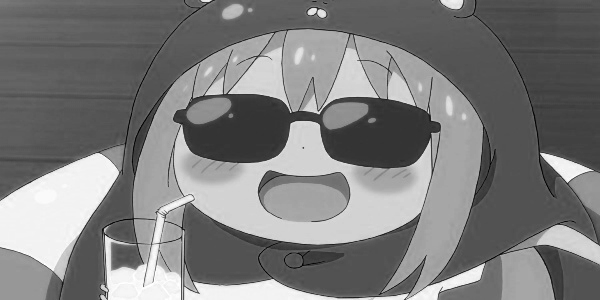

Размер зеленого канала: 300x600


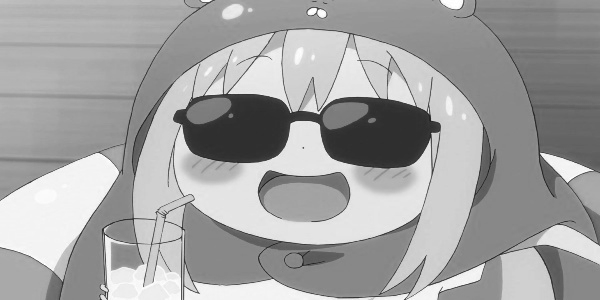

Размер красного канала: 300x600


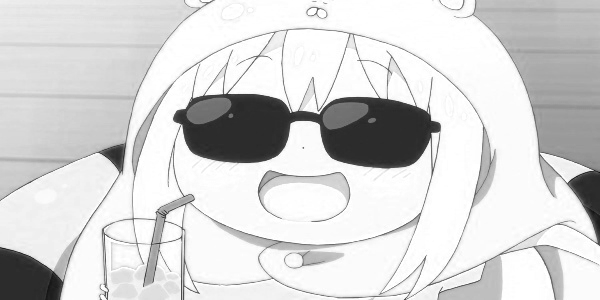

Канал - Синий канал
Размер изображения до фильтра Гаусса: 300x600
Размер изображения после добавления padding: 304x604
Размер изображения после фильтра Гаусса: 300x600


Канал - Зелёный канал
Размер изображения до фильтра Гаусса: 300x600
Размер изображения после добавления padding: 304x604
Размер изображения после фильтра Гаусса: 300x600


Канал - Красный канал
Размер изображения до фильтра Гаусса: 300x600
Размер изображения после добавления padding: 304x604
Размер изображения после фильтра Гаусса: 300x600


Промежуточные изображения каналов после фильтра Гаусса:
Размер синего канала после фильтра Гаусса: 300x600


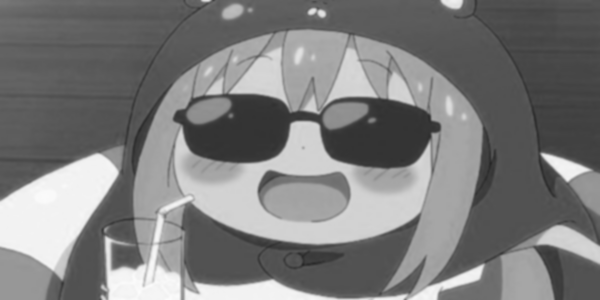

Размер зеленого канала после фильтра Гаусса: 300x600


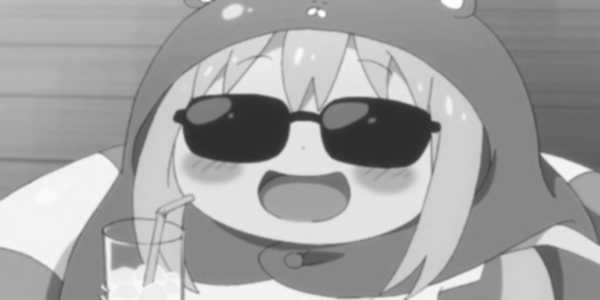

Размер красного канала после фильтра Гаусса: 300x600


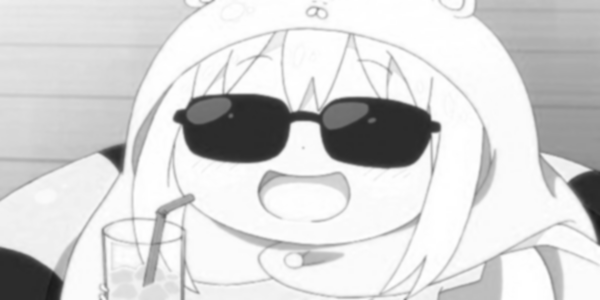



Размер итогового изображения после фильтра Гаусса: 300x600


Исходное изображение:


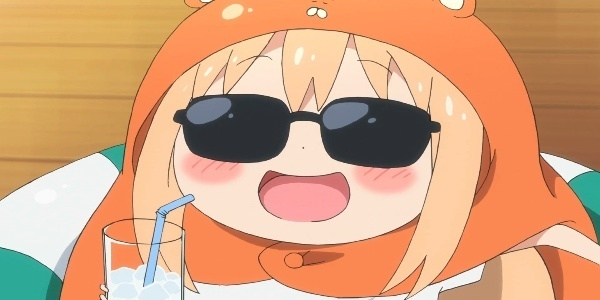




Изображение после фильтра Гаусса:


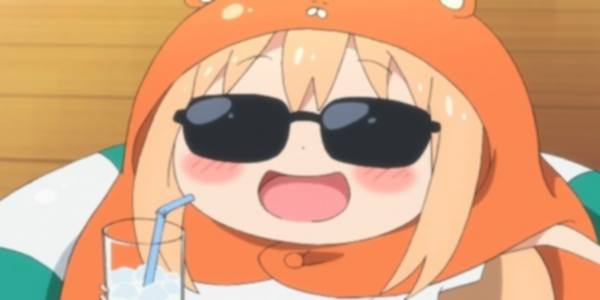

In [7]:
#@title Гауссовый фильтр (итоговый)
def gaussian_filter_manual(img, kernel_size, sigma, chanel):
    print("Канал - " + str(chanel))

    rows, cols = img.shape
    print(f"Размер изображения до фильтра Гаусса: {rows}x{cols}")

    if kernel_size % 2 == 0:
        print("Ошибка: Размер ядра должен быть нечетным.")
        return None

    padding = kernel_size // 2

    # Создаем расширенное изображение с replicate padding
    padded_img = np.zeros((rows + 2 * padding, cols + 2 * padding), dtype=img.dtype)
    padded_img[padding:rows + padding, padding:cols + padding] = img

    # Заполняем границы
    padded_img[:padding, padding:cols + padding] = img[0, :]  # Верхняя граница
    padded_img[rows + padding:, padding:cols + padding] = img[rows - 1, :]  # Нижняя граница
    padded_img[:, :padding] = np.tile(padded_img[:, padding:padding+1], padding)  # Левая граница
    padded_img[:, cols + padding:] = np.tile(padded_img[:, cols + padding - 1:cols + padding], padding)  # Правая граница

    # Вывод информации о размере увеличенного изображения
    print(f"Размер изображения после добавления padding: {padded_img.shape[0]}x{padded_img.shape[1]}")

    # Создаем ядро Гаусса
    gaussian_kernel = generate_gaussian_kernel(kernel_size, sigma)

    gaussian_filtered_img = np.zeros_like(img, dtype=img.dtype)

    # Применяем фильтр Гаусса ко всему расширенному изображению
    for i in range(padding, rows + padding):
        for j in range(padding, cols + padding):
            window = padded_img[i - padding:i + padding + 1, j - padding:j + padding + 1]
            gaussian_filtered_img[i-padding, j-padding] = np.sum(window * gaussian_kernel)

    print(f"Размер изображения после фильтра Гаусса: {gaussian_filtered_img.shape[0]}x{gaussian_filtered_img.shape[1]}")
    print("")
    print("")
    return gaussian_filtered_img


def gaussian_filter_color(img, kernel_size, sigma):

    b, g, r = cv2.split(img)  # Разделение на каналы

    # Вывод промежуточного изображения каналов до фильтра Гаусса
    print("Промежуточные изображения каналов до фильтра Гаусса:")
    print(f"Размер синего канала: {b.shape[0]}x{b.shape[1]}")
    cv2_imshow(b)
    print(f"Размер зеленого канала: {g.shape[0]}x{g.shape[1]}")
    cv2_imshow(g)
    print(f"Размер красного канала: {r.shape[0]}x{r.shape[1]}")
    cv2_imshow(r)

    b_filtered = gaussian_filter_manual(b, kernel_size, sigma, "Синий канал")  # Гауссовый фильтр синего канала
    g_filtered = gaussian_filter_manual(g, kernel_size, sigma, "Зелёный канал")  # Гауссовый фильтр зеленого канала
    r_filtered = gaussian_filter_manual(r, kernel_size, sigma, "Красный канал")  # Гауссовый фильтр красного канала


    # Вывод промежуточного изображения каналов после фильтра Гаусса
    print("Промежуточные изображения каналов после фильтра Гаусса:")
    print(f"Размер синего канала после фильтра Гаусса: {b_filtered.shape[0]}x{b_filtered.shape[1]}")
    cv2_imshow(b_filtered)
    print(f"Размер зеленого канала после фильтра Гаусса: {g_filtered.shape[0]}x{g_filtered.shape[1]}")
    cv2_imshow(g_filtered)
    print(f"Размер красного канала после фильтра Гаусса: {r_filtered.shape[0]}x{r_filtered.shape[1]}")
    cv2_imshow(r_filtered)

    filtered_img = cv2.merge((b_filtered, g_filtered, r_filtered))  # Объединение каналов
    print("")
    print("")
    print(f"Размер итогового изображения после фильтра Гаусса: {filtered_img.shape[0]}x{filtered_img.shape[1]}")

    return filtered_img

def generate_gaussian_kernel(kernel_size, sigma):
    """
    x, y = np.mgrid[-(kernel_size // 2):(kernel_size // 2) + 1, -(kernel_size // 2):(kernel_size // 2) + 1]
    gaussian_kernel = np.exp(- (x**2 + y**2) / (2 * sigma**2))
    gaussian_kernel = gaussian_kernel / np.sum(gaussian_kernel)  # Нормализуем ядро
    """
    kernel = np.zeros((kernel_size, kernel_size))
    center = kernel_size // 2

    sum_val = 0

    for i in range(kernel_size):
        for j in range(kernel_size):
            x = i - center
            y = j - center
            kernel[i, j] = np.exp(- (x**2 + y**2) / (2 * sigma**2))
            sum_val += kernel[i, j]

    # Нормализация ядра
    kernel = kernel / sum_val
    return kernel

if __name__ == '__main__':
    image_path = image_path_main  # Изображение
    kernel_size = 5  # Размер ядра
    sigma = 0.3 * ((kernel_size - 1) * 0.5 - 1) + 0.8  # Стандартное отклонение
    print("Sigma = " + str(sigma))
    print('')
    try:
        img = cv2.imread(image_path)
        if img is None:
            raise FileNotFoundError(f"Изображение не найдено по пути: {image_path}.")
    except FileNotFoundError as e:
        print(e)
        exit()
    except Exception as e:
        print(f"Ошибка при загрузке изображения: {e}")
        exit()

    print(f"Размер исходного изображения: {img.shape[0]}x{img.shape[1]}")
    filtered_img = gaussian_filter_color(img, kernel_size, sigma)

    if filtered_img is not None:
        print("")
        print("")
        print("Исходное изображение:")
        cv2_imshow(img)
        print("")
        print("")
        print("\nИзображение после фильтра Гаусса:")
        cv2_imshow(filtered_img)
    else:
        print("Обработка изображения не удалась.")

Размер исходного изображения: 300x600
Промежуточные изображения каналов до корректировки освещения:
Размер синего канала: 300x600


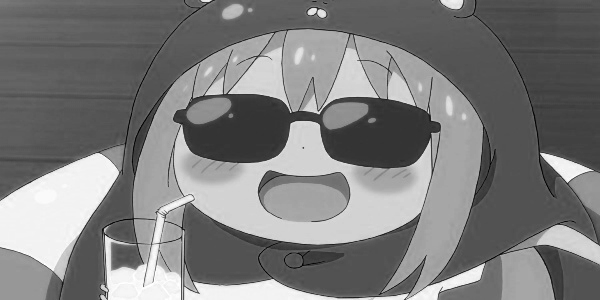

Размер зеленого канала: 300x600


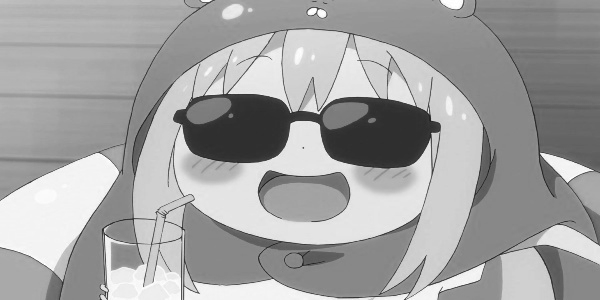

Размер красного канала: 300x600


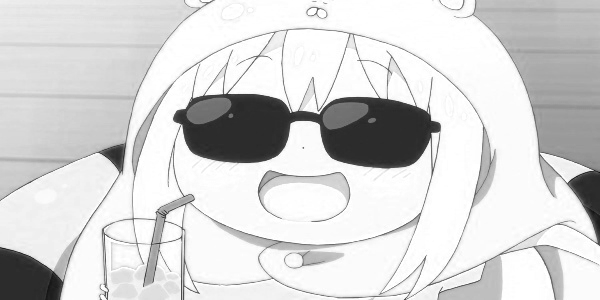

Канал - Синий канал
Размер изображения до корректировки освещения: 300x600
Размер изображения после корректировки освещения: 300x600


Канал - Зелёный канал
Размер изображения до корректировки освещения: 300x600
Размер изображения после корректировки освещения: 300x600


Канал - Красный канал
Размер изображения до корректировки освещения: 300x600
Размер изображения после корректировки освещения: 300x600


Промежуточные изображения каналов после корректировки освещения:
Размер синего канала после корректировки освещения: 300x600


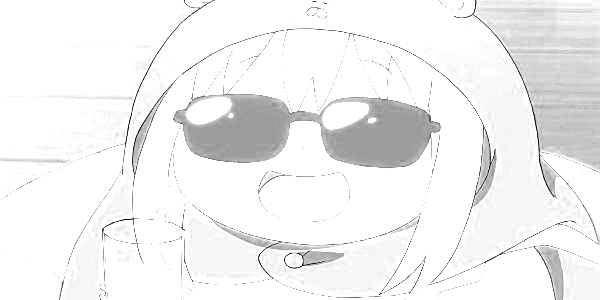

Размер зеленого канала после корректировки освещения: 300x600


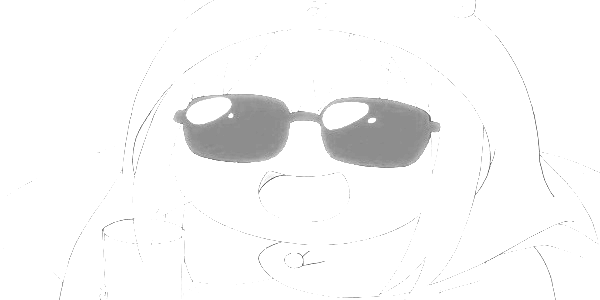

Размер красного канала после корректировки освещения: 300x600


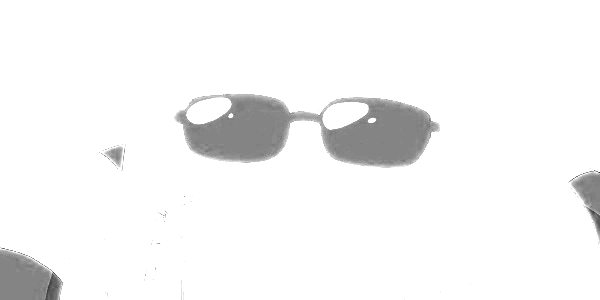



Размер итогового изображения после корректировки освещения: 300x600


Исходное изображение:


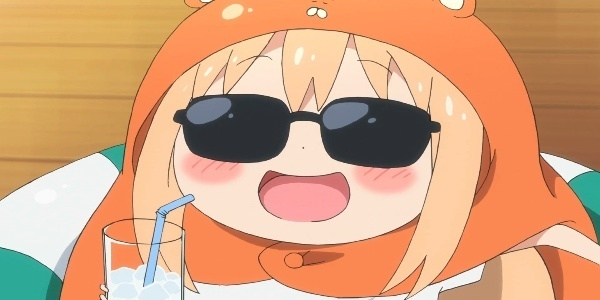




Изображение после корректировки освещения:


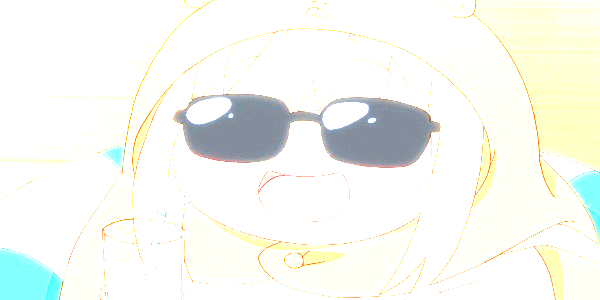

In [8]:
#@title Корректировка освещения (итоговый (коэфициент))
def adjust_brightness_manual(img, brightness_factor, chanel):
    print("Канал - " + str(chanel))

    rows, cols = img.shape
    print(f"Размер изображения до корректировки освещения: {rows}x{cols}")

    adjusted_img = img.astype(np.float64)

    # Корректируем яркость
    adjusted_img = adjusted_img * brightness_factor

    # Обрезаем значения, чтобы они оставались в диапазоне 0-255
    adjusted_img = np.clip(adjusted_img, 0, 255)

    # Возвращаем к типу uint8
    adjusted_img = adjusted_img.astype(np.uint8)

    print(f"Размер изображения после корректировки освещения: {adjusted_img.shape[0]}x{adjusted_img.shape[1]}")
    print("")
    print("")
    return adjusted_img


def adjust_brightness_color(img, brightness_factor):

    b, g, r = cv2.split(img)  # Разделение на каналы

    # Вывод промежуточного изображения каналов до корректировки освещения
    print("Промежуточные изображения каналов до корректировки освещения:")
    print(f"Размер синего канала: {b.shape[0]}x{b.shape[1]}")
    cv2_imshow(b)
    print(f"Размер зеленого канала: {g.shape[0]}x{g.shape[1]}")
    cv2_imshow(g)
    print(f"Размер красного канала: {r.shape[0]}x{r.shape[1]}")
    cv2_imshow(r)

    b_adjusted = adjust_brightness_manual(b, brightness_factor, "Синий канал")  # Корректировка синего канала
    g_adjusted = adjust_brightness_manual(g, brightness_factor, "Зелёный канал")  # Корректировка зеленого канала
    r_adjusted = adjust_brightness_manual(r, brightness_factor, "Красный канал")  # Корректировка красного канала

    if b_adjusted is None or g_adjusted is None or r_adjusted is None:
        print("Ошибка: Произошла ошибка при корректировке освещения одного из каналов.")
        return None

    # Вывод промежуточного изображения каналов после корректировки освещения
    print("Промежуточные изображения каналов после корректировки освещения:")
    print(f"Размер синего канала после корректировки освещения: {b_adjusted.shape[0]}x{b_adjusted.shape[1]}")
    cv2_imshow(b_adjusted)
    print(f"Размер зеленого канала после корректировки освещения: {g_adjusted.shape[0]}x{g_adjusted.shape[1]}")
    cv2_imshow(g_adjusted)
    print(f"Размер красного канала после корректировки освещения: {r_adjusted.shape[0]}x{r_adjusted.shape[1]}")
    cv2_imshow(r_adjusted)

    adjusted_img = cv2.merge((b_adjusted, g_adjusted, r_adjusted))  # Объединение каналов
    print("")
    print("")
    print(f"Размер итогового изображения после корректировки освещения: {adjusted_img.shape[0]}x{adjusted_img.shape[1]}")

    return adjusted_img


if __name__ == '__main__':
    image_path = image_path_main  # Изображение
    brightness_factor = 3  # Коэффициент корректировки яркости

    try:
        img = cv2.imread(image_path)
        if img is None:
            raise FileNotFoundError(f"Изображение не найдено по пути: {image_path}.")
    except FileNotFoundError as e:
        print(e)
        exit()
    except Exception as e:
        print(f"Ошибка при загрузке изображения: {e}")
        exit()

    print(f"Размер исходного изображения: {img.shape[0]}x{img.shape[1]}")
    adjusted_img = adjust_brightness_color(img, brightness_factor)

    if adjusted_img is not None:
        print("")
        print("")
        print("Исходное изображение:")
        cv2_imshow(img)
        print("")
        print("")
        print("\nИзображение после корректировки освещения:")
        cv2_imshow(adjusted_img)
    else:
        print("Обработка изображения не удалась.")

Размер исходного изображения: 300x600
Промежуточные изображения каналов до выравнивания гистограммы:
Размер синего канала: 300x600


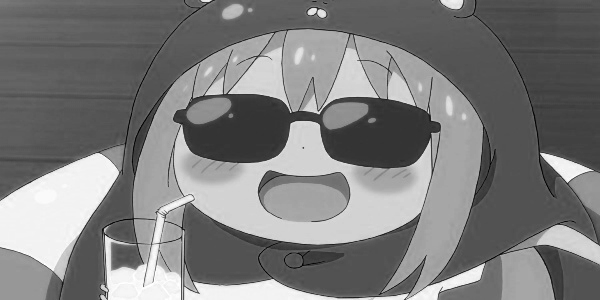

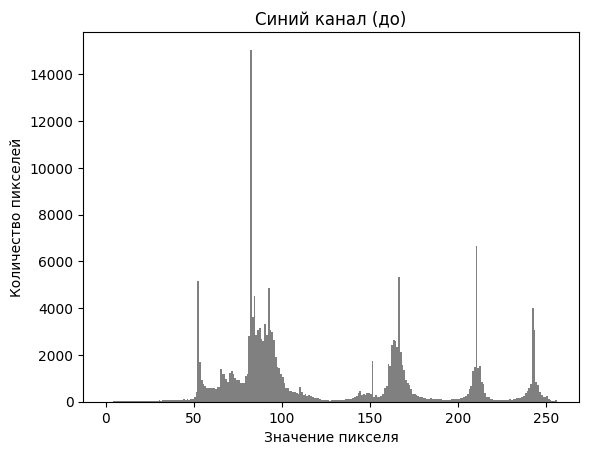

Размер зеленого канала: 300x600


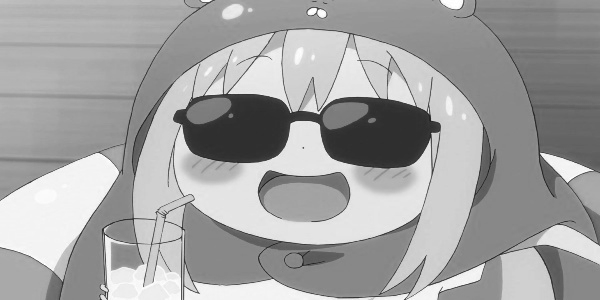

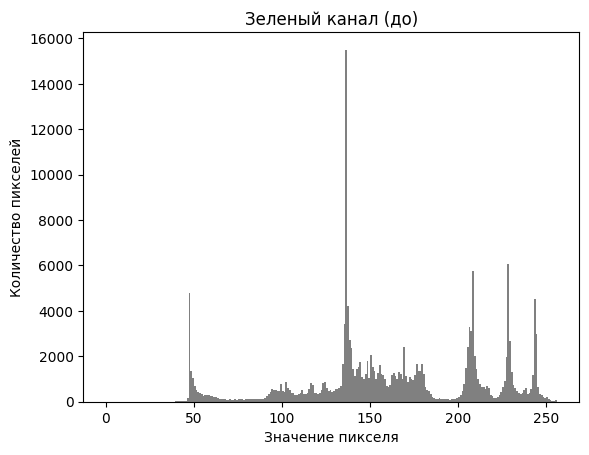

Размер красного канала: 300x600


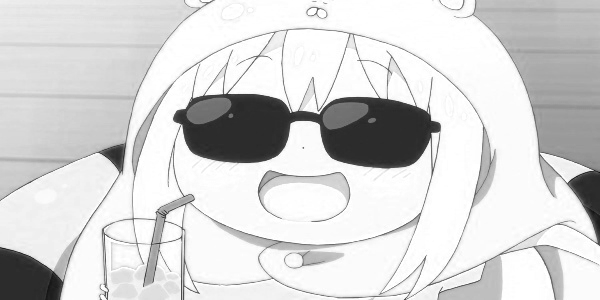

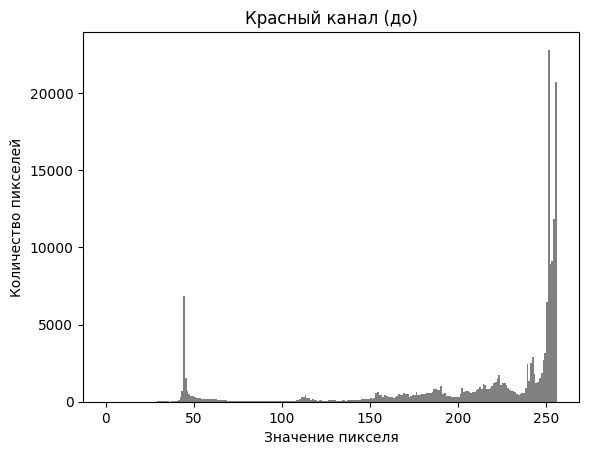

Канал - Синий канал
Размер изображения до выравнивания гистограммы: 300x600
Размер изображения после выравнивания гистограммы: 300x600


Канал - Зелёный канал
Размер изображения до выравнивания гистограммы: 300x600
Размер изображения после выравнивания гистограммы: 300x600


Канал - Красный канал
Размер изображения до выравнивания гистограммы: 300x600
Размер изображения после выравнивания гистограммы: 300x600


Промежуточные изображения каналов после выравнивания гистограммы:
Размер синего канала после выравнивания гистограммы: 300x600


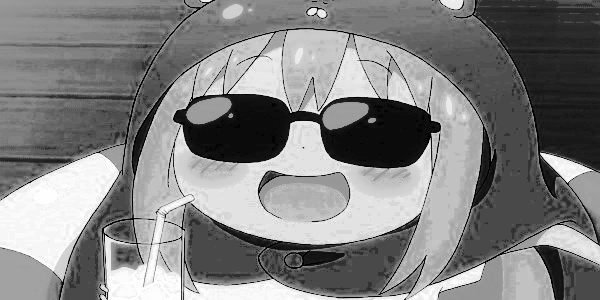

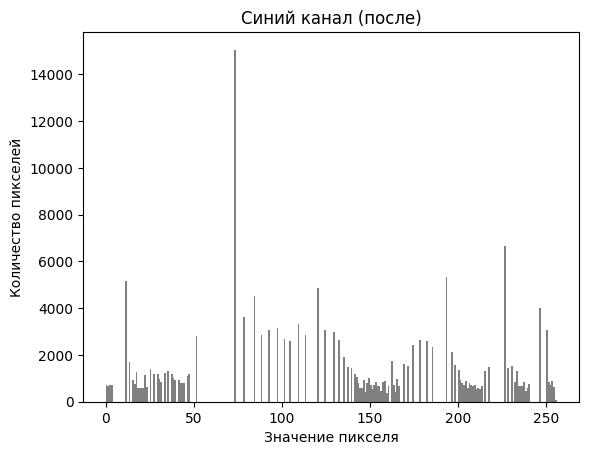

Размер зеленого канала после выравнивания гистограммы: 300x600


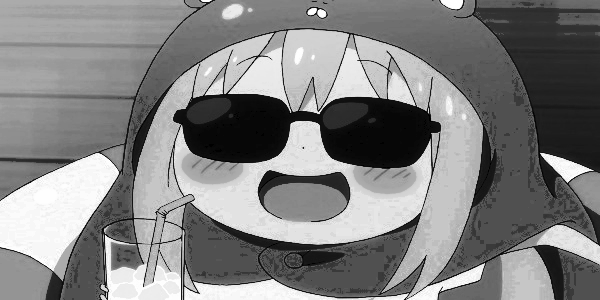

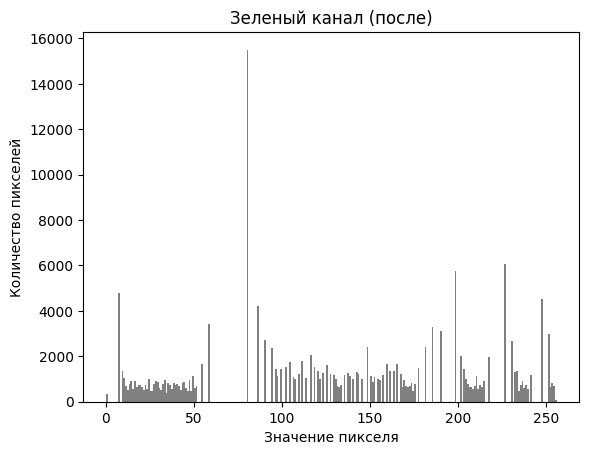

Размер красного канала после выравнивания гистограммы: 300x600


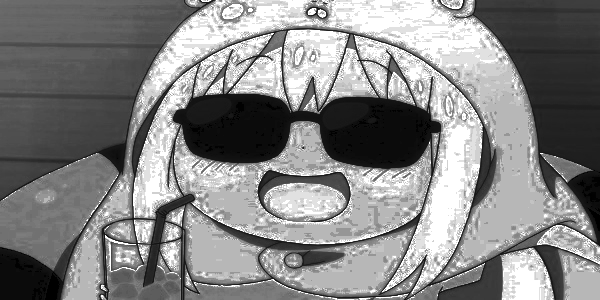

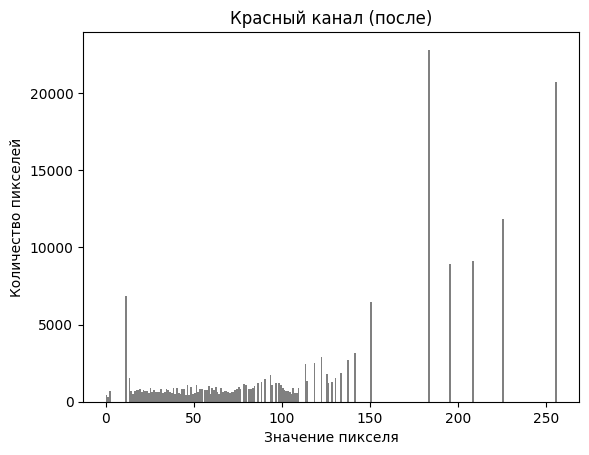



Размер итогового изображения после выравнивания гистограммы: 300x600


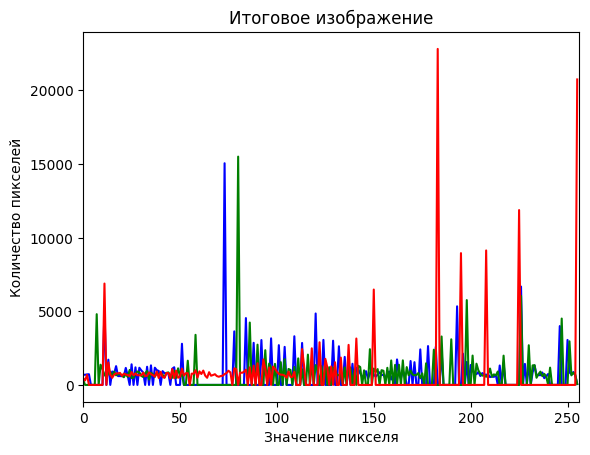



Исходное изображение:


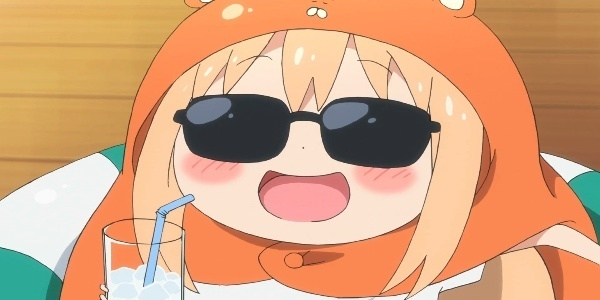

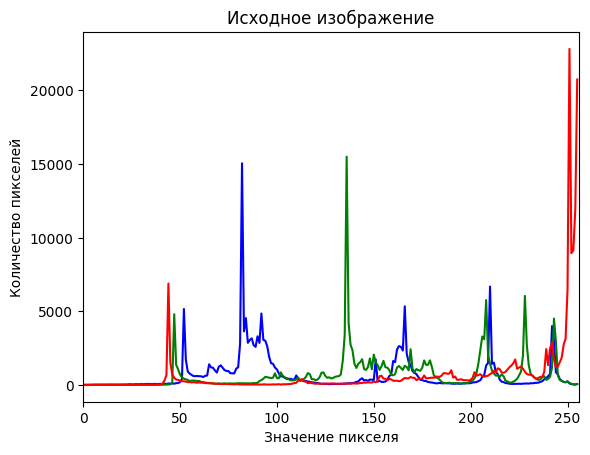




Изображение после выравнивания гистограммы:


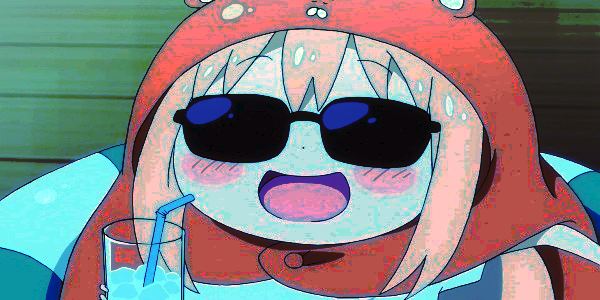

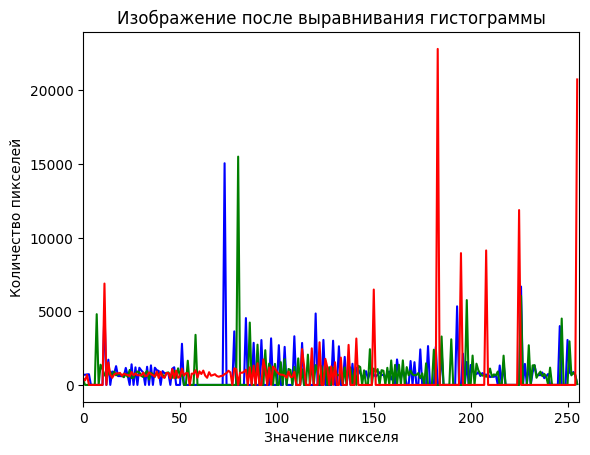

In [9]:
#@title Коректировка освещения (гистограмма)
def equalize_histogram_manual(img, channel):

    print(f"Канал - {channel}")
    rows, cols = img.shape
    print(f"Размер изображения до выравнивания гистограммы: {rows}x{cols}")

    hist, bins = np.histogram(img.flatten(), 256, [0,256])

    cdf = hist.cumsum()

    cdf_masked = np.ma.masked_equal(cdf, 0)

    cdf_min = cdf_masked.min()
    cdf_equalized = (cdf_masked - cdf_min) * 255 / (cdf_masked.max() - cdf_min)

    cdf_equalized = np.ma.filled(cdf_equalized, 0).astype('uint8')

    equalized_img = cdf_equalized[img]

    print(f"Размер изображения после выравнивания гистограммы: {equalized_img.shape[0]}x{equalized_img.shape[1]}")
    print("")
    print("")
    return equalized_img


def adjust_lighting_histogram(img):

    b, g, r = cv2.split(img)

    print("Промежуточные изображения каналов до выравнивания гистограммы:")
    print(f"Размер синего канала: {b.shape[0]}x{b.shape[1]}")
    cv2_imshow(b)
    plot_histogram(b, "Синий канал (до)")
    print(f"Размер зеленого канала: {g.shape[0]}x{g.shape[1]}")
    cv2_imshow(g)
    plot_histogram(g, "Зеленый канал (до)")
    print(f"Размер красного канала: {r.shape[0]}x{r.shape[1]}")
    cv2_imshow(r)
    plot_histogram(r, "Красный канал (до)")

    b_adjusted = equalize_histogram_manual(b, "Синий канал")  # Обработка синего канала
    g_adjusted = equalize_histogram_manual(g, "Зелёный канал")  # Обработка зеленого канала
    r_adjusted = equalize_histogram_manual(r, "Красный канал")  # Обработка красного канала

    if b_adjusted is None or g_adjusted is None or r_adjusted is None:
        print("Ошибка: Произошла ошибка при выравнивании гистограммы одного из каналов.")
        return None

    print("Промежуточные изображения каналов после выравнивания гистограммы:")
    print(f"Размер синего канала после выравнивания гистограммы: {b_adjusted.shape[0]}x{b_adjusted.shape[1]}")
    cv2_imshow(b_adjusted)
    plot_histogram(b_adjusted, "Синий канал (после)")
    print(f"Размер зеленого канала после выравнивания гистограммы: {g_adjusted.shape[0]}x{g_adjusted.shape[1]}")
    cv2_imshow(g_adjusted)
    plot_histogram(g_adjusted, "Зеленый канал (после)")
    print(f"Размер красного канала после выравнивания гистограммы: {r_adjusted.shape[0]}x{r_adjusted.shape[1]}")
    cv2_imshow(r_adjusted)
    plot_histogram(r_adjusted, "Красный канал (после)")

    adjusted_img = cv2.merge((b_adjusted, g_adjusted, r_adjusted))  # Объединение каналов
    print("")
    print("")
    print(f"Размер итогового изображения после выравнивания гистограммы: {adjusted_img.shape[0]}x{adjusted_img.shape[1]}")
    plot_histogram(adjusted_img, "Итоговое изображение")

    return adjusted_img

def plot_histogram(img, title):
  """Строит и отображает гистограмму для изображения."""
  if len(img.shape) == 2:
      plt.hist(img.flatten(), bins=256, range=[0,256], color='gray')
  else:
      color = ('b','g','r')
      for i,col in enumerate(color):
          histr = cv2.calcHist([img],[i],None,[256],[0,256])
          plt.plot(histr,color = col)
          plt.xlim([0,256])
  plt.title(title)
  plt.xlabel("Значение пикселя")
  plt.ylabel("Количество пикселей")
  plt.show()


if __name__ == '__main__':
    image_path = image_path_main  # Изображение

    try:
        img = cv2.imread(image_path)
        if img is None:
            raise FileNotFoundError(f"Изображение не найдено по пути: {image_path}.")
    except FileNotFoundError as e:
        print(e)
        exit()
    except Exception as e:
        print(f"Ошибка при загрузке изображения: {e}")
        exit()

    print(f"Размер исходного изображения: {img.shape[0]}x{img.shape[1]}")
    adjusted_img = adjust_lighting_histogram(img)

    if adjusted_img is not None:
        print("")
        print("")
        print("Исходное изображение:")
        cv2_imshow(img)
        plot_histogram(img, "Исходное изображение")
        print("")
        print("")
        print("\nИзображение после выравнивания гистограммы:")
        cv2_imshow(adjusted_img)
        plot_histogram(adjusted_img, "Изображение после выравнивания гистограммы")
    else:
        print("Обработка изображения не удалась.")

Размер исходного изображения: 300x600
Промежуточные изображения каналов до гамма-коррекции:
Размер синего канала: 300x600


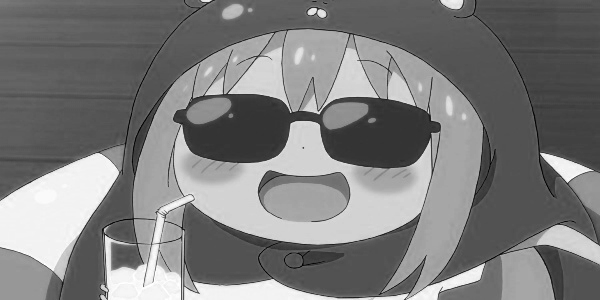

Размер зеленого канала: 300x600


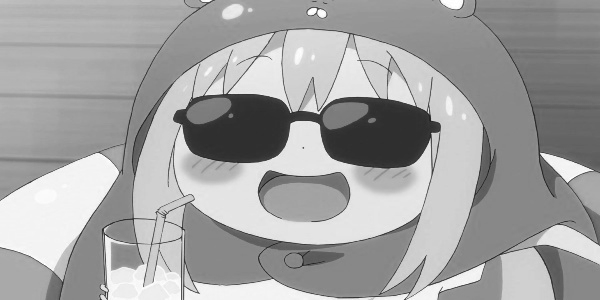

Размер красного канала: 300x600


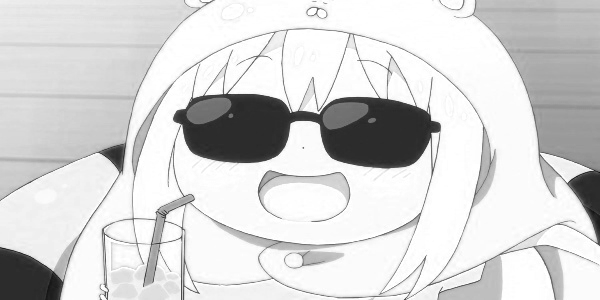

Канал - Синий канал
Размер изображения до гамма-коррекции: 300x600
Размер изображения после гамма-коррекции: 300x600


Канал - Зелёный канал
Размер изображения до гамма-коррекции: 300x600
Размер изображения после гамма-коррекции: 300x600


Канал - Красный канал
Размер изображения до гамма-коррекции: 300x600
Размер изображения после гамма-коррекции: 300x600


Промежуточные изображения каналов после гамма-коррекции:
Размер синего канала после гамма-коррекции: 300x600


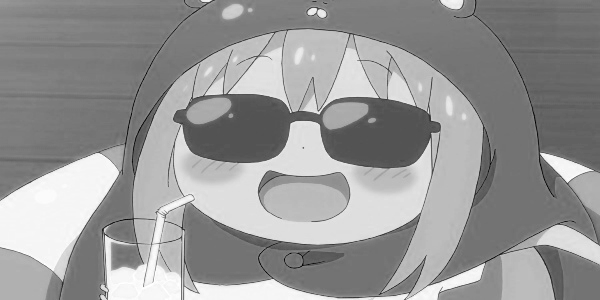

Размер зеленого канала после гамма-коррекции: 300x600


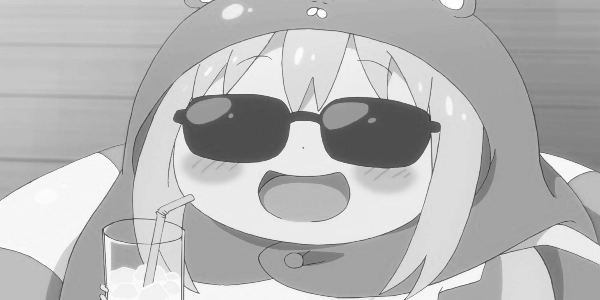

Размер красного канала после гамма-коррекции: 300x600


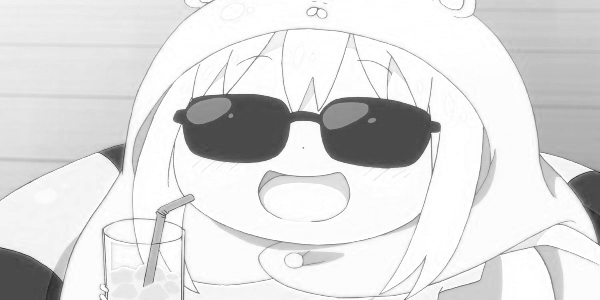



Размер итогового изображения после гамма-коррекции: 300x600


Исходное изображение:


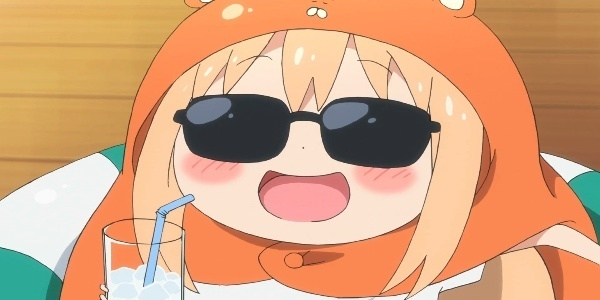




Изображение после гамма-коррекции:


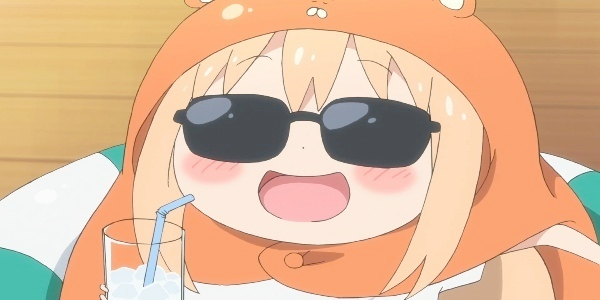

In [10]:
# @title Корректировка освещения (Гамма-коррекция)
def adjust_gamma_manual(img, gamma, channel):
    print(f"Канал - {channel}")

    rows, cols = img.shape
    print(f"Размер изображения до гамма-коррекции: {rows}x{cols}")
    gamma_corrected_img = np.zeros_like(img, dtype=np.uint8)
    img_float = img.astype(np.float64)  # Преобразование в float для вычислений
    img_gamma = np.power(img_float / 255.0, gamma) * 255.0
    gamma_corrected_img = np.clip(img_gamma, 0, 255).astype(np.uint8)  # Ограничение значений и преобразование обратно
    print(f"Размер изображения после гамма-коррекции: {gamma_corrected_img.shape[0]}x{gamma_corrected_img.shape[1]}")
    print("")
    print("")
    return gamma_corrected_img

def adjust_gamma_color(img, gamma):

    b, g, r = cv2.split(img)  # Разделение на каналы

    print("Промежуточные изображения каналов до гамма-коррекции:")
    print(f"Размер синего канала: {b.shape[0]}x{b.shape[1]}")
    cv2_imshow(b)
    print(f"Размер зеленого канала: {g.shape[0]}x{g.shape[1]}")
    cv2_imshow(g)
    print(f"Размер красного канала: {r.shape[0]}x{r.shape[1]}")
    cv2_imshow(r)

    b_adjusted = adjust_gamma_manual(b, gamma, "Синий канал")  # Корректировка синего канала
    g_adjusted = adjust_gamma_manual(g, gamma, "Зелёный канал")  # Корректировка зеленого канала
    r_adjusted = adjust_gamma_manual(r, gamma, "Красный канал")  # Корректировка красного канала

    if b_adjusted is None or g_adjusted is None or r_adjusted is None:
        print("Ошибка: Произошла ошибка при гамма-коррекции одного из каналов.")
        return None

    print("Промежуточные изображения каналов после гамма-коррекции:")
    print(f"Размер синего канала после гамма-коррекции: {b_adjusted.shape[0]}x{b_adjusted.shape[1]}")
    cv2_imshow(b_adjusted)
    print(f"Размер зеленого канала после гамма-коррекции: {g_adjusted.shape[0]}x{g_adjusted.shape[1]}")
    cv2_imshow(g_adjusted)
    print(f"Размер красного канала после гамма-коррекции: {r_adjusted.shape[0]}x{r_adjusted.shape[1]}")
    cv2_imshow(r_adjusted)

    adjusted_img = cv2.merge((b_adjusted, g_adjusted, r_adjusted))  # Объединение каналов
    print("")
    print("")
    print(f"Размер итогового изображения после гамма-коррекции: {adjusted_img.shape[0]}x{adjusted_img.shape[1]}")
    return adjusted_img

if __name__ == '__main__':
    image_path = image_path_main
    gamma = 0.7  # Гамма-параметр (0 < gamma < 2)

    try:
        img = cv2.imread(image_path)
        if img is None:
            raise FileNotFoundError(f"Изображение не найдено по пути: {image_path}.")
    except FileNotFoundError as e:
        print(e)
        exit()
    except Exception as e:
        print(f"Ошибка при загрузке изображения: {e}")
        exit()

    print(f"Размер исходного изображения: {img.shape[0]}x{img.shape[1]}")
    gamma_corrected_img = adjust_gamma_color(img, gamma)

    if gamma_corrected_img is not None:
        print("")
        print("")
        print("Исходное изображение:")
        cv2_imshow(img)
        print("")
        print("")
        print("\nИзображение после гамма-коррекции:")
        cv2_imshow(gamma_corrected_img)
    else:
        print("Обработка изображения не удалась.")

Размер исходного изображения: 300x600
Промежуточные изображения каналов до бинаризации:
Размер синего канала: 300x600


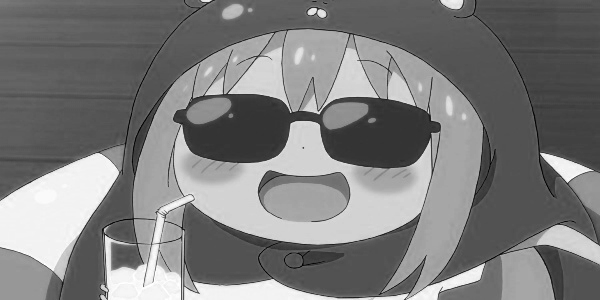

Размер зеленого канала: 300x600


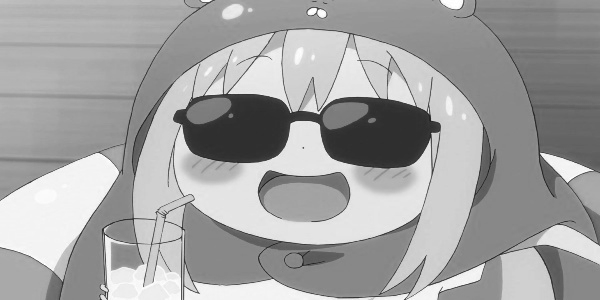

Размер красного канала: 300x600


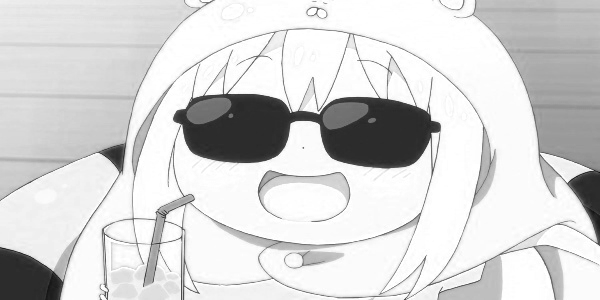

Канал - Синий канал
Размер изображения до бинаризации: 300x600
Размер изображения после бинаризации: 300x600


Канал - Зелёный канал
Размер изображения до бинаризации: 300x600
Размер изображения после бинаризации: 300x600


Канал - Красный канал
Размер изображения до бинаризации: 300x600
Размер изображения после бинаризации: 300x600


Промежуточные изображения каналов после бинаризации:
Размер синего канала после бинаризации: 300x600


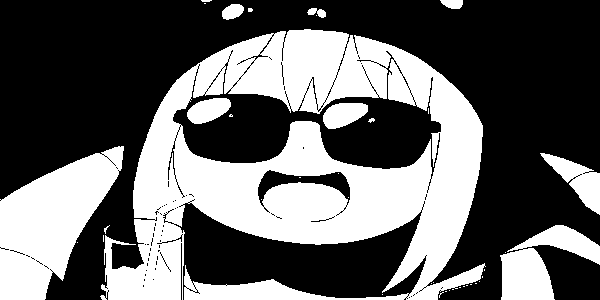

Размер зеленого канала после бинаризации: 300x600


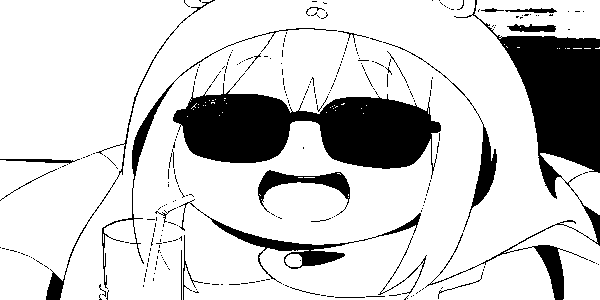

Размер красного канала после бинаризации: 300x600


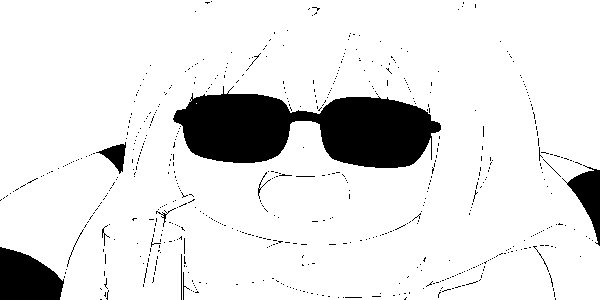



Размер итогового изображения после бинаризации: 300x600


Исходное изображение:


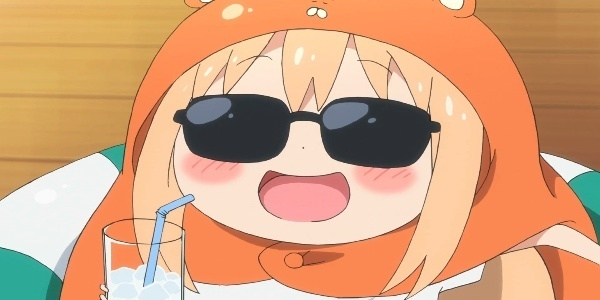




Бинаризованное изображение:


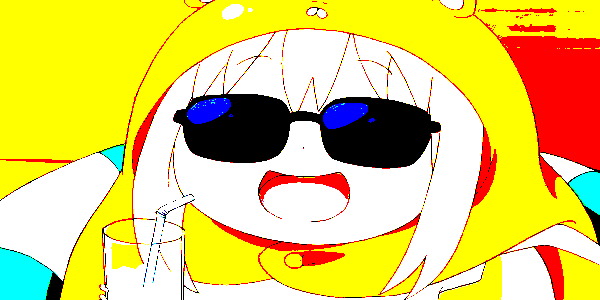

In [11]:
#@title Бинаризация изображения (итоговый)
def binarize_manual(img, threshold, chanel):
    print("Канал - " + str(chanel))

    rows, cols = img.shape
    print(f"Размер изображения до бинаризации: {rows}x{cols}")

    binarized_img = np.zeros_like(img, dtype=np.uint8)

    # Применяем бинаризацию
    for i in range(rows):
        for j in range(cols):
            if img[i, j] > threshold:
                binarized_img[i, j] = 255  # Белый цвет
            else:
                binarized_img[i, j] = 0  # Черный цвет

    print(f"Размер изображения после бинаризации: {binarized_img.shape[0]}x{binarized_img.shape[1]}")
    print("")
    print("")
    return binarized_img


def binarize_color(img, threshold):

    b, g, r = cv2.split(img)  # Разделение на каналы

    # Вывод промежуточного изображения каналов до бинаризации
    print("Промежуточные изображения каналов до бинаризации:")
    print(f"Размер синего канала: {b.shape[0]}x{b.shape[1]}")
    cv2_imshow(b)
    print(f"Размер зеленого канала: {g.shape[0]}x{g.shape[1]}")
    cv2_imshow(g)
    print(f"Размер красного канала: {r.shape[0]}x{r.shape[1]}")
    cv2_imshow(r)

    b_binarized = binarize_manual(b, threshold, "Синий канал")  # Бинаризация синего канала
    g_binarized = binarize_manual(g, threshold, "Зелёный канал")  # Бинаризация зеленого канала
    r_binarized = binarize_manual(r, threshold, "Красный канал")  # Бинаризация красного канала

    # Вывод промежуточного изображения каналов после бинаризации
    print("Промежуточные изображения каналов после бинаризации:")
    print(f"Размер синего канала после бинаризации: {b_binarized.shape[0]}x{b_binarized.shape[1]}")
    cv2_imshow(b_binarized)
    print(f"Размер зеленого канала после бинаризации: {g_binarized.shape[0]}x{g_binarized.shape[1]}")
    cv2_imshow(g_binarized)
    print(f"Размер красного канала после бинаризации: {r_binarized.shape[0]}x{r_binarized.shape[1]}")
    cv2_imshow(r_binarized)

    binarized_img = cv2.merge((b_binarized, g_binarized, r_binarized))  # Объединение каналов
    print("")
    print("")
    print(f"Размер итогового изображения после бинаризации: {binarized_img.shape[0]}x{binarized_img.shape[1]}")

    return binarized_img

# Загрузка изображения и применение бинаризации
if __name__ == '__main__':
    image_path = image_path_main
    threshold = 128  # Пороговое значение

    try:
        img = cv2.imread(image_path)
        if img is None:
            raise FileNotFoundError(f"Изображение не найдено по пути: {image_path}.")
    except FileNotFoundError as e:
        print(e)
        exit()
    except Exception as e:
        print(f"Ошибка при загрузке изображения: {e}")
        exit()

    print(f"Размер исходного изображения: {img.shape[0]}x{img.shape[1]}")
    binarized_img = binarize_color(img, threshold)

    if binarized_img is not None:
        print("")
        print("")
        print("Исходное изображение:")
        cv2_imshow(img)
        print("")
        print("")
        print("\nБинаризованное изображение:")
        cv2_imshow(binarized_img)
    else:
        print("Обработка изображения не удалась.")

